<a href="https://colab.research.google.com/github/stepan-zykov/DLS/blob/main/second_semester/HW4/Attention_and_transformers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<p style="align: center;"><img src="https://static.tildacdn.com/tild6636-3531-4239-b465-376364646465/Deep_Learning_School.png" width="400"></p>

# Глубокое обучение. Часть 2
# Домашнее задание по теме "Механизм внимания"

Это домашнее задание проходит в формате peer-review. Это означает, что его будут проверять ваши однокурсники. Поэтому пишите разборчивый код, добавляйте комментарии и пишите выводы после проделанной работы.

В этом задании вы будете решать задачу классификации математических задач по темам (многоклассовая классификация) с помощью Transformer.

В качестве датасета возьмем датасет математических задач по разным темам. Нам необходим следующий файл:

[Файл с классами](https://docs.google.com/spreadsheets/d/1IMRxByfg7gjoZ5i7rxvuNDvSrbdOJOc-/edit?usp=drive_link&ouid=104379615679964018037&rtpof=true&sd=true)

**Hint:** не перезаписывайте модели, которые вы получите на каждом из этапов этого дз. Они ещё понадобятся.

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [2]:
%load_ext tensorboard
!rm -rf /content/gdrive/MyDrive/DLS/second_semester/HW/HW4_Transformers/runs

In [3]:
%tensorboard --logdir /content/gdrive/MyDrive/DLS/second_semester/HW/HW4_Transformers/runs

<IPython.core.display.Javascript object>

Случайно затер логи(

In [4]:
!pip install pymorphy2 -q
!pip install datasets -q
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [5]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import matplotlib.ticker as ticker
from transformers import get_scheduler
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

import pandas as pd
import numpy as np
import random
import math
import time
import string
import pymorphy2
import re
from typing import List

from datasets import load_dataset
from transformers import BertTokenizer, BertModel

from nltk.corpus import stopwords

from tqdm.notebook import tqdm
from torch.utils.tensorboard import SummaryWriter

import os
from datetime import datetime
from torch.nn.utils.rnn import pad_sequence
from typing import Union
import copy

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [6]:
BASE_FOLDER_PATH = 'gdrive/MyDrive/DLS/second_semester/HW/HW4_Transformers'
BATCH_SIZE = 8
EPOCHS = 5
MODEL_NAME = 'model_v0'
LR = 0.00005
N_HEADS = 1
TRAIN_SIZE = 20000
TEST_SIZE = 1000

MODEL_FOLDER_PATH = os.path.join(BASE_FOLDER_PATH, MODEL_NAME)

SCHEDULER_LAMBDA_PARAM = 0.96
PAD_IND = 0
HIDDEN_DIM = 768

RUSSIAN_STOP_WORDS = set(stopwords.words('russian'))
PUNCT_WORD_TOKENIZER = nltk.WordPunctTokenizer() # for preprocess
# for broadening your horizons use it for lemmatization
MORPH_ANALYZER = pymorphy2.MorphAnalyzer()

### Считываем данные

In [7]:
df = pd.read_excel('gdrive/MyDrive/DLS/second_semester/HW/HW4_Transformers/data_problems.xlsx')
df.shape

(5273, 3)

In [8]:
texts = df['Задача'].to_list()
len(texts)

5273

In [9]:
labels = df['Тема'].to_list()
len(labels)

5273

In [10]:
texts_labels = list(zip(texts, labels))
len(texts_labels)

5273

### Разобьем данные на обучающую и тестовую выборки

In [11]:
train_data, test_data = train_test_split(texts_labels, test_size=0.1)

In [12]:
len(train_data)

4745

In [13]:
len(test_data)

528

### Создадим датасеты и даталоудеры

In [14]:
def preprocess_text(text):
    nums_filtered_text = re.sub(r'[0-9]+', '', text.lower())
    punct_filtered_text = ''.join(
        [ch for ch in nums_filtered_text if ch not in string.punctuation]
    )
    tokens = PUNCT_WORD_TOKENIZER.tokenize(punct_filtered_text)
    filtr_stop_words_tokens = [MORPH_ANALYZER.parse(token)[0].normal_form for token in tokens
                             if token not in RUSSIAN_STOP_WORDS]
    norm_tokens = [MORPH_ANALYZER.parse(token)[0].normal_form for token in filtr_stop_words_tokens]

    return f"[CLS] {' '.join(norm_tokens)}"

In [15]:
tokenizer = BertTokenizer.from_pretrained('tbs17/MathBert')

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


In [16]:
lengths = []
FIRST_START = True
if FIRST_START:
  lengths = [len(tokenizer.tokenize(text_label[0])) for text_label in tqdm(train_data)]

  0%|          | 0/4745 [00:00<?, ?it/s]

### Распределение длин текстов

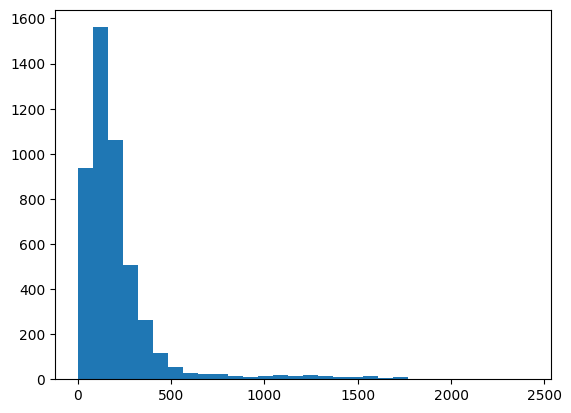

In [17]:
if lengths:
  plt.hist(lengths, bins=30)

In [18]:
def length_to_mask(length, max_len=None, dtype=None):
    """length: B.
    return B x max_len.
    If max_len is None, then max of length will be used.
    """
    assert len(length.shape) == 1, 'Length shape should be 1 dimensional.'
    max_len = max_len or length.max().item()
    mask = torch.arange(max_len, device=length.device,
                        dtype=length.dtype).expand(len(length), max_len) < length.unsqueeze(1)
    if dtype is not None:
        mask = torch.as_tensor(mask, dtype=dtype, device=length.device)
    return mask

In [19]:
theme_to_ind = {theme: ind for ind, theme in enumerate(df['Тема'].unique().tolist())}
ind_to_theme = {ind: theme for theme, ind in theme_to_ind.items()}

### Переведем темы в индексы

In [20]:
theme_to_ind

{'Графы': 0,
 'Геометрия': 1,
 'Многочлен': 2,
 'Комбинаторика': 3,
 'Теория чисел': 4,
 'Инвариант': 5,
 'Дирихле': 6}

In [21]:
ind_to_theme

{0: 'Графы',
 1: 'Геометрия',
 2: 'Многочлен',
 3: 'Комбинаторика',
 4: 'Теория чисел',
 5: 'Инвариант',
 6: 'Дирихле'}

In [22]:
class MyDataset(Dataset):
  def __init__(self, texts_labels, tokenizer, device=device):
    self.texts_labels = texts_labels # hugging dataset object
    self.tokenizer = tokenizer
    self.device = device

  def __getitem__(self, idx):
    text = self.texts_labels[idx][0]
    normalized_text = preprocess_text(text)
    target = theme_to_ind[self.texts_labels[idx][1]]

    encoded_text = tokenizer(normalized_text,
                             padding="max_length",
                             max_length=512,
                             truncation=True,
                             return_tensors='pt')

    # Encoded input contains the input_ids and attention_mask
    text_ids = encoded_text['input_ids'].squeeze(0) # Remove batch dimension
    attention_mask = encoded_text['attention_mask'].squeeze(0)

    return {'input_ids': text_ids, 'attention_mask': attention_mask, 'labels': target}

  def __len__(self):
    return len(self.texts_labels)

In [23]:
train_dataset = MyDataset(train_data, tokenizer=tokenizer)
test_dataset = MyDataset(test_data, tokenizer=tokenizer)

In [24]:
train_dataloader = DataLoader(train_dataset, shuffle=True, batch_size=BATCH_SIZE, drop_last=True)
test_dataloader = DataLoader(test_dataset, shuffle=False, batch_size=3, drop_last=True)

-----------------------

### Задание 1 (2 балла)

Напишите кастомный класс для модели трансформера для задачи классификации, использующей в качествке backbone какую-то из моделей huggingface.

Т.е. конструктор класса должен принимать на вход название модели и подгружать её из huggingface, а затем использовать в качестве backbone (достаточно возможности использовать в качестве backbone те модели, которые упомянуты в последующих пунктах)

In [25]:
class TransformerClassificationModel(nn.Module):
  def __init__(self, base_transformer_modelL: str):
    super().__init__()
    self.backbone = BertModel.from_pretrained(base_transformer_modelL, output_attentions=True)
    self.classifier = nn.Sequential(nn.Linear(in_features=self.backbone.pooler.dense.out_features, out_features=256),
                                     nn.ReLU(),
                                     nn.Linear(in_features=256, out_features=7))

  def forward(self, input_ids, attention_mask, labels):
    backbone_output = self.backbone(input_ids=input_ids, attention_mask=attention_mask)
    result = self.classifier(backbone_output.pooler_output)

    return result, backbone_output.attentions

### Задание 2 (1 балл)

Напишите функцию заморозки backbone у модели (если необходимо, возвращайте из функции модель)

In [26]:
def freeze_backbone_function(model: TransformerClassificationModel):
    for param in model.backbone.parameters():
      param.requires_grad = False

    return model

### Задание 3 (2 балла)

Напишите функцию, которая будет использована для тренировки (дообучения) трансформера (TransformerClassificationModel). Функция должна поддерживать обучение с замороженным и размороженным backbone.

In [27]:
timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')
def train_one_epoch(epoch_index, model, training_loader, scheduler, loss_fn, optimizer, tb_writer, device):
    running_loss = 0.
    last_loss = 0.
    train_loss = 0.

    i = 0
    cnt_right_answers = 0
    cnt_answers = 0

    all_answers = []
    answers_probs = []
    all_labels = []
    for batch in tqdm(training_loader):
        batch = {k: v.to(device) for k, v in batch.items()}

        if epoch_index != -1:
            optimizer.zero_grad()
        labels = batch['labels'].long()
        outputs, attention = model(**batch)

        answers = outputs.argmax(axis=-1)
        loss = loss_fn(outputs, labels)
        if epoch_index != -1:
            loss.backward()
            optimizer.step()

        running_loss += loss.item()
        train_loss += loss.item()
        if i % 10 == 9 and epoch_index != -1:
            last_loss = running_loss / 10 # loss per batch
            tb_x = epoch_index * len(training_loader) + i + 1
            tb_writer.add_scalar('Loss/train', last_loss, tb_x)
            running_loss = 0.

        if i % 10 == 0 and scheduler is not None:
            tb_x = epoch_index * len(training_loader) + i + 1
            tb_writer.add_scalar('Scheduler LR', optimizer.param_groups[0]["lr"], tb_x)
            scheduler.step()

        cnt_answers += labels.shape[0]
        cnt_right_answers += (answers == labels).sum().item()

        i += 1

    train_loss = train_loss / len(training_loader)
    tb_writer.add_scalar('Accuracy/train', cnt_right_answers / cnt_answers, epoch_index + 1)

    return train_loss

In [28]:
def validation(epoch_number, val_dataloader, device):
    val_loss = 0.0

    all_answers = []
    answers_probs = []
    all_labels = []

    cnt_answers = 0
    cnt_right_answers = 0
    model.eval()
    with torch.no_grad():
        for i, batch in tqdm(enumerate(val_dataloader)):
            batch = {k: v.to(device) for k, v in batch.items()}
            optimizer.zero_grad()
            labels = batch['labels'].long()
            outputs, attention = model(**batch)

            vloss = loss_fn(outputs, labels)
            val_loss += vloss.item()
            answers = outputs.argmax(axis=-1)

            cnt_answers += labels.shape[0]
            cnt_right_answers += (answers == labels).sum().item()

            del batch, labels

    val_loss = val_loss / len(val_dataloader)
    accuracy = cnt_right_answers / cnt_answers
    print("VAL LOSS =", val_loss)
    return val_loss, accuracy

In [27]:
import copy

def train_transformer(transformer_model, num_epochs,
                      optimizer, sheduler, loss_fn,
                      training_loader, val_dataloader, writer,
                      device, model_folder_path,
                      freeze_backbone=True):
    best_vloss = 1_000_000.

    model = copy.copy(transformer_model).to(device)
    if freeze_backbone:
      model = freeze_backbone_function(model)

    if not os.path.exists(model_folder_path):
      os.makedirs(model_folder_path)

    for epoch_number in tqdm(range(num_epochs)):
      print('EPOCH {}'.format(epoch_number + 1))
      model.train()
      train_loss = train_one_epoch(
          epoch_index=epoch_number,
          model=model,
          training_loader=training_loader,
          scheduler=scheduler,
          loss_fn=loss_fn,
          optimizer=optimizer,
          tb_writer=writer,
          device=device)

      model.eval()
      val_loss, val_acc = validation(epoch_number, val_dataloader, device)

      writer.add_scalar('Loss/Valid', val_loss, epoch_number + 1)
      writer.add_scalar('Accuracy/valid', val_acc, epoch_number + 1)
      if val_loss < best_vloss:
        best_vloss = val_loss
        model_path = os.path.join(model_folder_path, 'model_{}_{}'.format(epoch_number + 1, timestamp))
        torch.save(model.state_dict(), model_path)

    return model

### Задание 4 (1 балл)

Проверьте вашу функцию из предыдущего пункта, дообучив двумя способами
*cointegrated/rubert-tiny2* из huggingface.

## cointegrated/rubert-tiny2

### Замороженный backbone

In [ ]:
model_name = 'cointegrated/rubert-tiny2'
model = TransformerClassificationModel(model_name)
model_folder_path = os.path.join(BASE_FOLDER_PATH, model_name.replace('/', '_'))
num_epochs = 5
num_training_steps = num_epochs * len(train_dataloader)
optimizer = optim.AdamW(model.parameters(), lr=LR)
scheduler = get_scheduler(
    name="linear", optimizer=optimizer, num_warmup_steps=0, num_training_steps=num_training_steps)
loss_fn = torch.nn.CrossEntropyLoss()
writer = SummaryWriter(os.path.join(BASE_FOLDER_PATH, 'runs/{}'.format(model_name.replace('/', '_'))))

In [ ]:
cointegrated_rubert_tiny2 = train_transformer(transformer_model=model,
                                     num_epochs=num_epochs,
                                     optimizer=optimizer,
                                     sheduler=scheduler,
                                     loss_fn=loss_fn,
                                     training_loader=train_dataloader,
                                     val_dataloader=test_dataloader,
                                     writer=writer,
                                     device=device,
                                     model_folder_path=model_folder_path,
                                     freeze_backbone=True)

  0%|          | 0/5 [00:00<?, ?it/s]

EPOCH 1


  0%|          | 0/593 [00:00<?, ?it/s]

0it [00:00, ?it/s]

VAL LOSS = 1.5502503514289856
EPOCH 2


  0%|          | 0/593 [00:00<?, ?it/s]

0it [00:00, ?it/s]

VAL LOSS = 1.5184962017969652
EPOCH 3


  0%|          | 0/593 [00:00<?, ?it/s]

0it [00:00, ?it/s]

VAL LOSS = 1.4941927499391816
EPOCH 4


  0%|          | 0/593 [00:00<?, ?it/s]

0it [00:00, ?it/s]

VAL LOSS = 1.4746020551432262
EPOCH 5


  0%|          | 0/593 [00:00<?, ?it/s]

0it [00:00, ?it/s]

VAL LOSS = 1.4555946993218227


### Незамороженный backbone

In [ ]:
model_name = 'cointegrated/rubert-tiny2'
model = TransformerClassificationModel(model_name)
model_name += '_not_freezed'
model_folder_path = os.path.join(BASE_FOLDER_PATH, model_name.replace('/', '_'))
num_epochs = 5
num_training_steps = num_epochs * len(train_dataloader)
optimizer = optim.AdamW(model.parameters(), lr=LR)
scheduler = get_scheduler(
    name="linear", optimizer=optimizer, num_warmup_steps=0, num_training_steps=num_training_steps)
loss_fn = torch.nn.CrossEntropyLoss()
writer = SummaryWriter(os.path.join(BASE_FOLDER_PATH, 'runs/{}'.format(model_name.replace('/', '_'))))

config.json:   0%|          | 0.00/693 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/118M [00:00<?, ?B/s]

In [ ]:
cointegrated_rubert_tiny2_not_freezed = train_transformer(transformer_model=model,
                                     num_epochs=num_epochs,
                                     optimizer=optimizer,
                                     sheduler=scheduler,
                                     loss_fn=loss_fn,
                                     training_loader=train_dataloader,
                                     val_dataloader=test_dataloader,
                                     writer=writer,
                                     device=device,
                                     model_folder_path=model_folder_path,
                                     freeze_backbone=False)

  0%|          | 0/5 [00:00<?, ?it/s]

EPOCH 1


  0%|          | 0/593 [00:00<?, ?it/s]

0it [00:00, ?it/s]

VAL LOSS = 1.151873955249109
EPOCH 2


  0%|          | 0/593 [00:00<?, ?it/s]

0it [00:00, ?it/s]

VAL LOSS = 1.042159886141731
EPOCH 3


  0%|          | 0/593 [00:00<?, ?it/s]

0it [00:00, ?it/s]

VAL LOSS = 0.9879126361655918
EPOCH 4


  0%|          | 0/593 [00:00<?, ?it/s]

0it [00:00, ?it/s]

VAL LOSS = 1.0110721923410892
EPOCH 5


  0%|          | 0/593 [00:00<?, ?it/s]

0it [00:00, ?it/s]

VAL LOSS = 0.9611276797950268


### Задание 5 (1 балл)

Обучите *tbs17/MathBert* (с замороженным backbone и без заморозки), проанализируйте результаты. Сравните скоры с первым заданием. Получилось лучше или нет? Почему?

## tbs17/MathBert

### Замороженный backbone

In [32]:
model_name = 'tbs17/MathBert'
model_folder_path = os.path.join(BASE_FOLDER_PATH, model_name.replace('/', '_'))
model = TransformerClassificationModel(model_name)
num_epochs = 5
num_training_steps = num_epochs * len(train_dataloader)
optimizer = optim.AdamW(model.parameters(), lr=LR)
scheduler = get_scheduler(
    name="linear", optimizer=optimizer, num_warmup_steps=0, num_training_steps=num_training_steps)
loss_fn = torch.nn.CrossEntropyLoss()
writer = SummaryWriter(os.path.join(BASE_FOLDER_PATH, 'runs/{}'.format(model_name.replace('/', '_'))))

In [ ]:
fine_tuned_tbs17 = train_transformer(transformer_model=model,
                                     num_epochs=num_epochs,
                                     optimizer=optimizer,
                                     sheduler=scheduler,
                                     loss_fn=loss_fn,
                                     training_loader=train_dataloader,
                                     val_dataloader=test_dataloader,
                                     writer=writer,
                                     device=device,
                                     model_folder_path=model_folder_path,
                                     freeze_backbone=True)

  0%|          | 0/5 [00:00<?, ?it/s]

EPOCH 1


  0%|          | 0/593 [00:00<?, ?it/s]

0it [00:00, ?it/s]

VAL LOSS = 1.5560115152461962
EPOCH 2


  0%|          | 0/593 [00:00<?, ?it/s]

0it [00:00, ?it/s]

VAL LOSS = 1.5080670084465633
EPOCH 3


  0%|          | 0/593 [00:00<?, ?it/s]

0it [00:00, ?it/s]

VAL LOSS = 1.4747910223562608
EPOCH 4


  0%|          | 0/593 [00:00<?, ?it/s]

0it [00:00, ?it/s]

VAL LOSS = 1.4511213927445086
EPOCH 5


  0%|          | 0/593 [00:00<?, ?it/s]

0it [00:00, ?it/s]

VAL LOSS = 1.4333582508631728


### Незамороженный backbone

In [ ]:
model_name = 'tbs17/MathBert'
model = TransformerClassificationModel(model_name)
model_name += 'not_freezed'
model_folder_path = os.path.join(BASE_FOLDER_PATH, model_name.replace('/', '_'))
num_epochs = 5
num_training_steps = num_epochs * len(train_dataloader)
optimizer = optim.AdamW(model.parameters(), lr=LR)
scheduler = get_scheduler(
    name="linear", optimizer=optimizer, num_warmup_steps=0, num_training_steps=num_training_steps)
loss_fn = torch.nn.CrossEntropyLoss()
writer = SummaryWriter(os.path.join(BASE_FOLDER_PATH, 'runs/{}'.format(model_name.replace('/', '_'))))

In [ ]:
fine_tuned_tbs17_not_freezed = train_transformer(transformer_model=model,
                                     num_epochs=num_epochs,
                                     optimizer=optimizer,
                                     sheduler=scheduler,
                                     loss_fn=loss_fn,
                                     training_loader=train_dataloader,
                                     val_dataloader=test_dataloader,
                                     writer=writer,
                                     device=device,
                                     model_folder_path=model_folder_path,
                                     freeze_backbone=False)

  0%|          | 0/5 [00:00<?, ?it/s]

EPOCH 1


  0%|          | 0/593 [00:00<?, ?it/s]

0it [00:00, ?it/s]

VAL LOSS = 1.431690194898031
EPOCH 2


  0%|          | 0/593 [00:00<?, ?it/s]

0it [00:00, ?it/s]

VAL LOSS = 1.575669096613472
EPOCH 3


  0%|          | 0/593 [00:00<?, ?it/s]

0it [00:00, ?it/s]

VAL LOSS = 1.5268814218315212
EPOCH 4


  0%|          | 0/593 [00:00<?, ?it/s]

0it [00:00, ?it/s]

VAL LOSS = 1.4954773895442486
EPOCH 5


  0%|          | 0/593 [00:00<?, ?it/s]

0it [00:00, ?it/s]

VAL LOSS = 1.5731959600340237


Для tbs скор лучше при заморозке backbone, для tiny2 - при обучении всей сети. При этом скор tiny2 лучше чем у tbs. Возможно, это объясняется тем, что у tiny2 меньше обучаемых параметров, и данных достаточно для обучения сети целиком. Для обучения tbs целиком данных недостаточно, поэтому при разморозке backbone качество падает.

### Задание 6 (1 балл)

Напишите функцию для отрисовки карт внимания первого слоя для моделей из задания

In [130]:
def get_attention_fig(sentence, attention, n_heads = 12, n_rows = 4, n_cols = 3):
    assert n_rows * n_cols == n_heads

    fig = plt.figure(figsize=(12 * n_cols, 12 * n_rows))

    for i in range(n_heads):

        ax = fig.add_subplot(n_rows, n_cols, i+1)
        _attention = attention[i]

        cax = ax.matshow(_attention, cmap='viridis', interpolation='none')

        ax.tick_params(labelsize=12)
        ticks = [t.lower() for t in sentence]
        # ax.set_xticks(range(len(ticks)))
        # ax.set_yticks(range(len(ticks)))
        ax.set_xticklabels(ticks,
                           rotation=45)
        ax.set_yticklabels(ticks)

        ax.xaxis.set_major_formatter(ticker.FixedFormatter(ticks))
        ax.yaxis.set_major_formatter(ticker.FixedFormatter(ticks))

    return fig

In [132]:
def draw_first_layer_attention_maps(model: TransformerClassificationModel,
                                    dataloader: DataLoader, tokenizer: BertTokenizer,
                                    batch_number=3, device='cuda'):
    with torch.no_grad():
        for i, batch in enumerate(dataloader):
            batch = {k: v.to(device) for k, v in batch.items()}
            _, attention = model(**batch)
            text_ind = np.random.randint(0, len(batch['input_ids'])) # случайно выбираем текст
            input_ids = batch["input_ids"][text_ind].squeeze().tolist()
            real_word_indices = [i for i, token_id in enumerate(input_ids) if token_id not in
                [tokenizer.cls_token_id, tokenizer.sep_token_id,
                 tokenizer.pad_token_id, tokenizer.unk_token, tokenizer.mask_token]]
            filtered_attention  = attention[0][text_ind][:, real_word_indices, :]
            filtered_attention = filtered_attention[:, :, real_word_indices]
            filtered_attention = filtered_attention.cpu().detach().numpy()

            real_words = tokenizer.decode([input_ids[i] for i in real_word_indices]).split()
            fig = get_attention_fig(real_words, filtered_attention)
            fig.show()
            if i >= batch_number - 1:
              return

### Задание 7 (1 балл)

Проведите инференс для всех моделей **ДО ДООБУЧЕНИЯ** на 2-3 текстах из датасета. Посмотрите на головы Attention первого слоя в каждой модели на выбранных текстах (отрисуйте их отдельно).

Попробуйте их проинтерпретировать. Какие связи улавливают карты внимания? (если в модели много голов Attention, то проинтерпретируйте наиболее интересные)

In [95]:
tbs_model = TransformerClassificationModel('tbs17/MathBert').to(device)
tiny_model = TransformerClassificationModel('cointegrated/rubert-tiny2').to(device)

<ipython-input-130-bb7f92b6b28f>:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ticks,
<ipython-input-130-bb7f92b6b28f>:19: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ticks)
<ipython-input-130-bb7f92b6b28f>:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(ticker.FixedFormatter(ticks))
<ipython-input-130-bb7f92b6b28f>:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.yaxis.set_major_formatter(ticker.FixedFormatter(ticks))


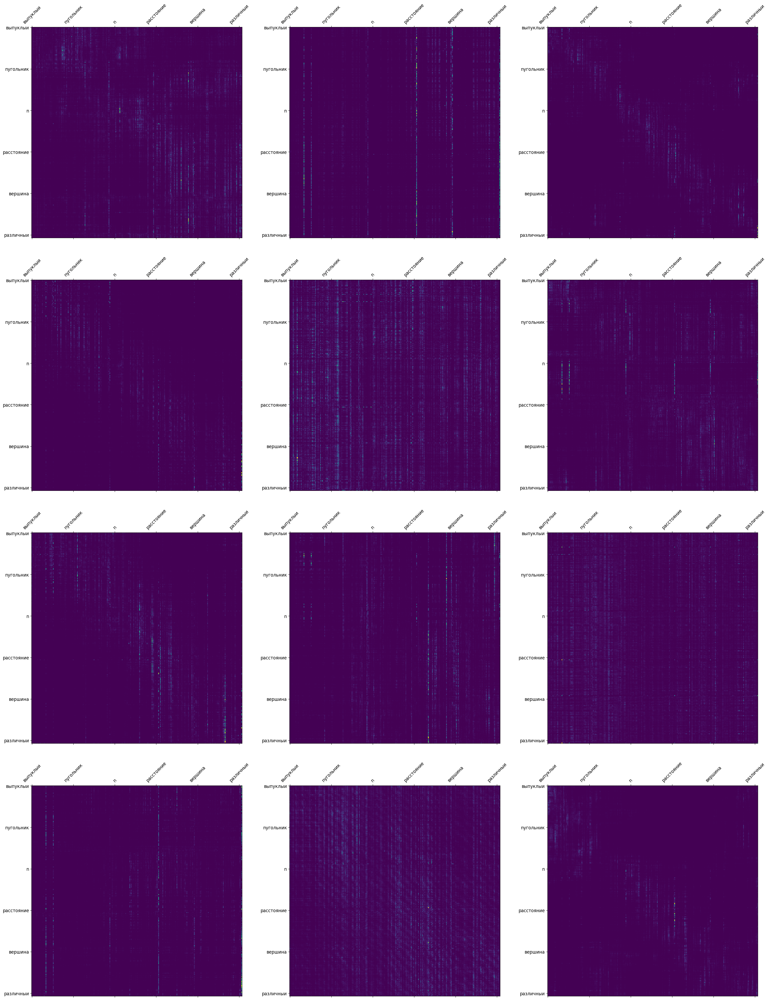

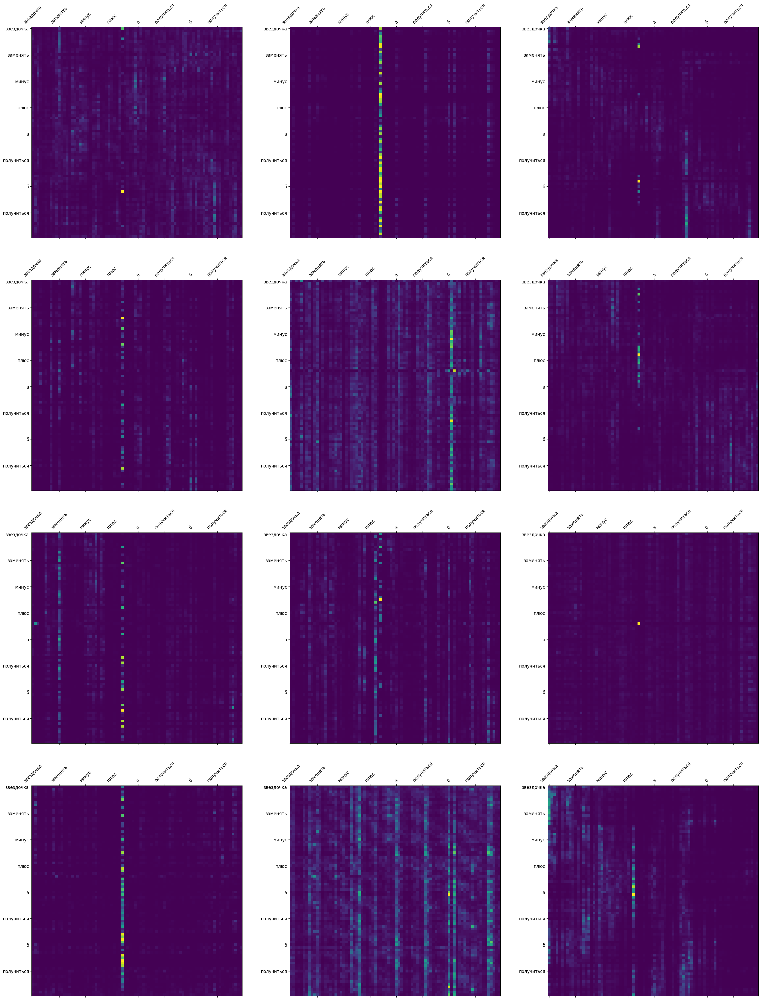

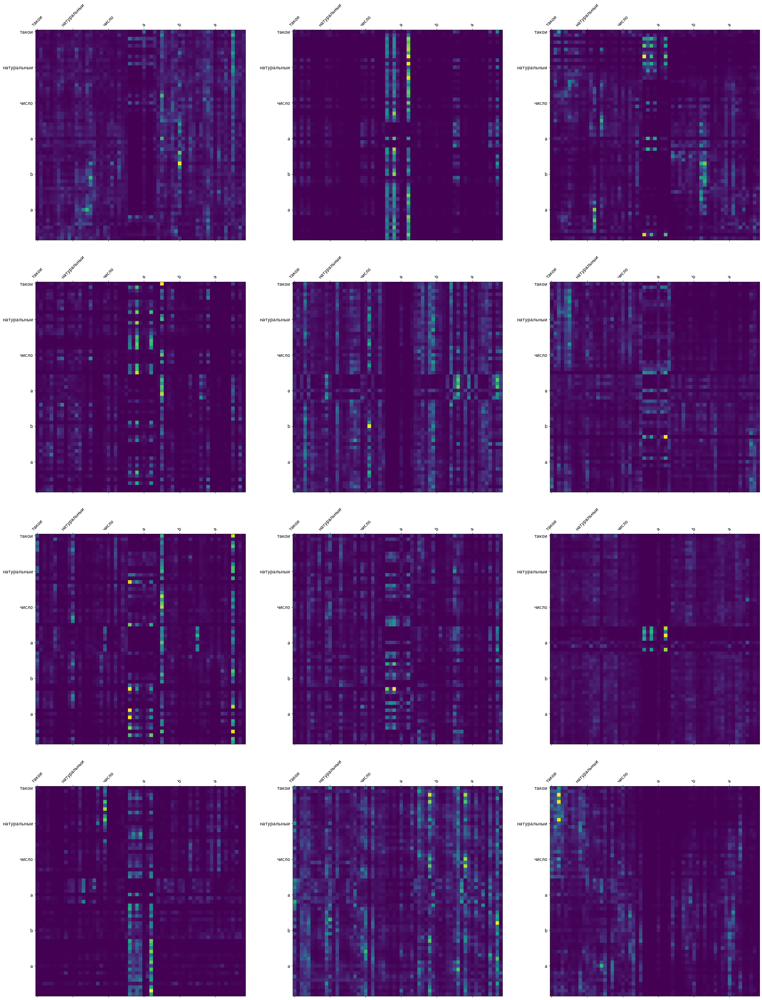

In [133]:
draw_first_layer_attention_maps(tbs_model, test_dataloader, tokenizer, device=device)

<ipython-input-130-bb7f92b6b28f>:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ticks,
<ipython-input-130-bb7f92b6b28f>:19: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ticks)
<ipython-input-130-bb7f92b6b28f>:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(ticker.FixedFormatter(ticks))
<ipython-input-130-bb7f92b6b28f>:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.yaxis.set_major_formatter(ticker.FixedFormatter(ticks))


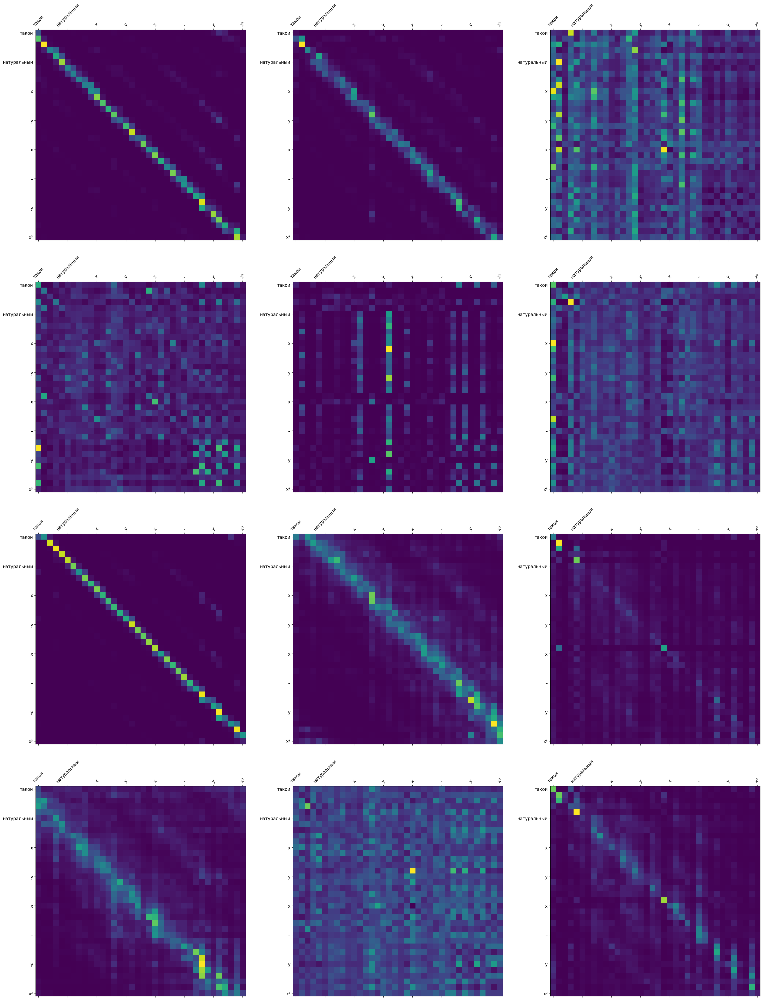

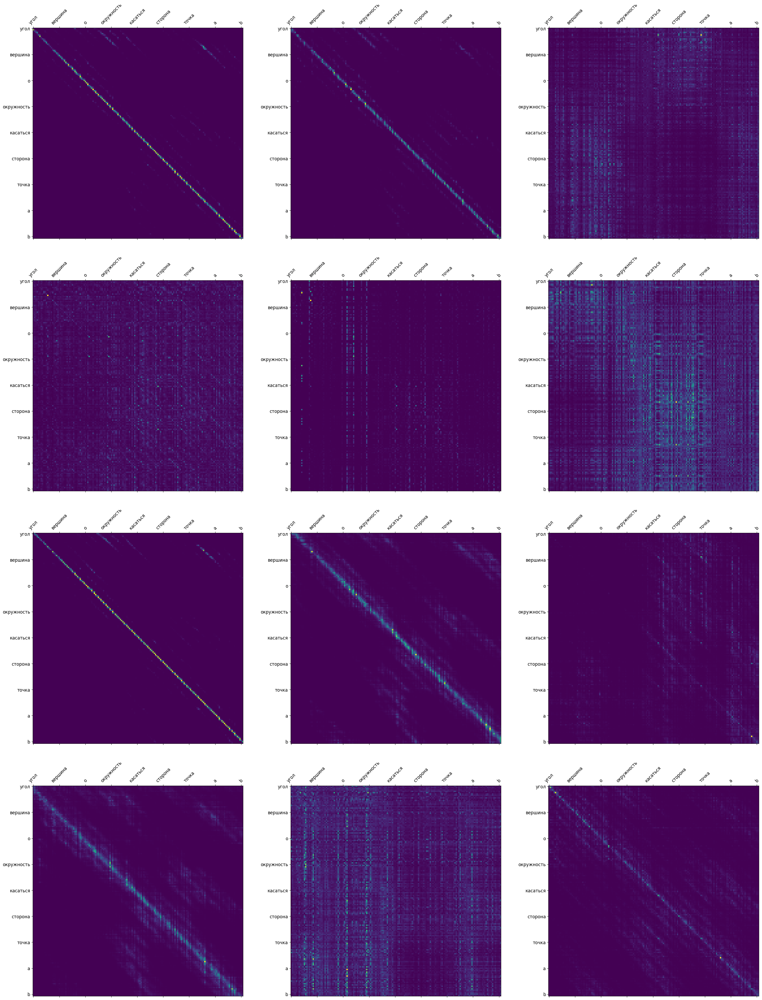

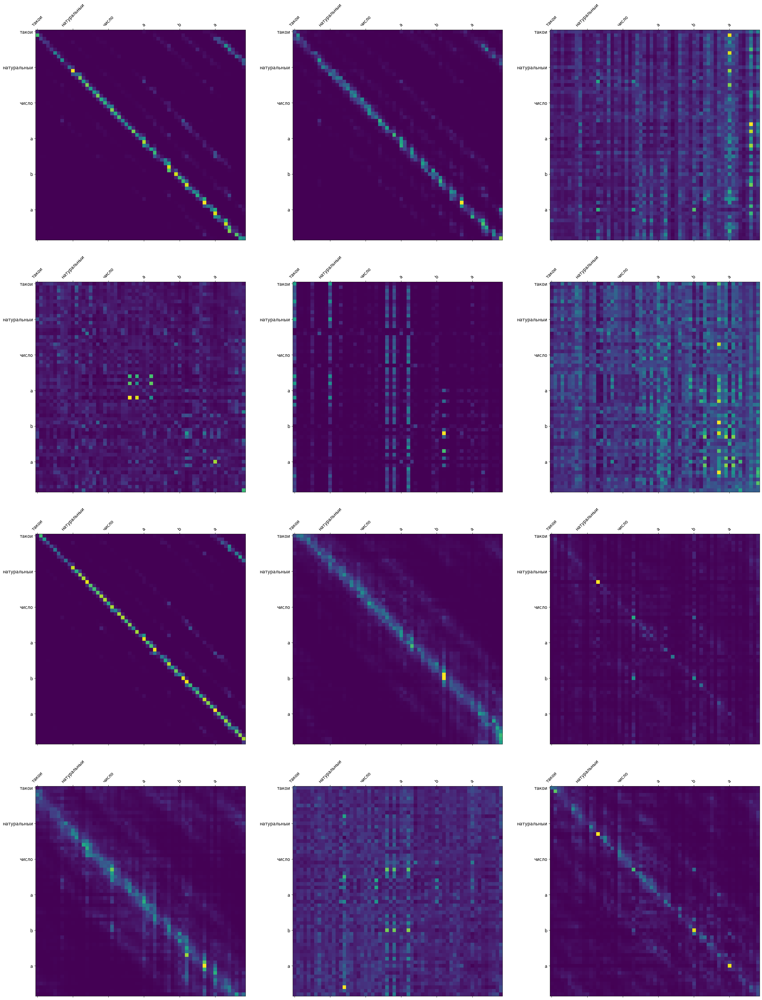

In [134]:
draw_first_layer_attention_maps(tiny_model, test_dataloader, tokenizer, device=device)

На графиках видно, что разные головы Attention улавливают разные связи в одном и том же тексте. Особенно сильно отличаются графики для различных моделей. Для rubert-tiny2 во многих головах наиболее сильно внимание слов на самих себя.

### Задание 8 (1 балл)

Сделайте то же самое для дообученных моделей. Изменились ли карты внимания и связи, которые они улавливают? Почему?

### Рассмотрим лучшие модели: tbs17 с замороженным backbone и rubert-tiny2 с незамороженным backbone

In [138]:
tbs17_state_dict = torch.load('gdrive/MyDrive/DLS/second_semester/HW/HW4_Transformers/tbs17_MathBert/model_5_20240408_191835')

In [140]:
model_name = 'tbs17/MathBert'
trained_tbs17 = TransformerClassificationModel(model_name)
trained_tbs17.load_state_dict(tbs17_state_dict)

<All keys matched successfully>

In [144]:
trained_tbs17 = trained_tbs17.to(device)

In [141]:
tiny_state_dict = torch.load('gdrive/MyDrive/DLS/second_semester/HW/HW4_Transformers/cointegrated_rubert-tiny2_not_freezed/model_5_20240409_185557')

In [142]:
model_name = 'cointegrated/rubert-tiny2'
trained_tiny = TransformerClassificationModel(model_name)
trained_tiny.load_state_dict(tiny_state_dict)

<All keys matched successfully>

In [145]:
trained_tiny = trained_tiny.to(device)

# tbs17

<ipython-input-130-bb7f92b6b28f>:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ticks,
<ipython-input-130-bb7f92b6b28f>:19: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ticks)
<ipython-input-130-bb7f92b6b28f>:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(ticker.FixedFormatter(ticks))
<ipython-input-130-bb7f92b6b28f>:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.yaxis.set_major_formatter(ticker.FixedFormatter(ticks))


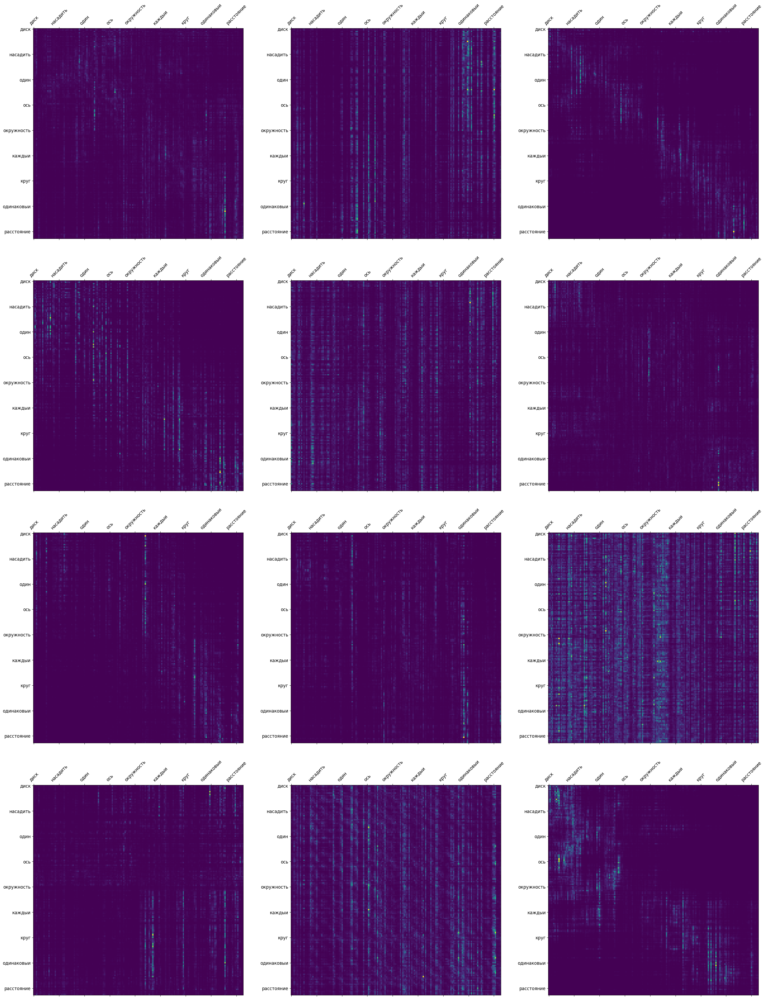

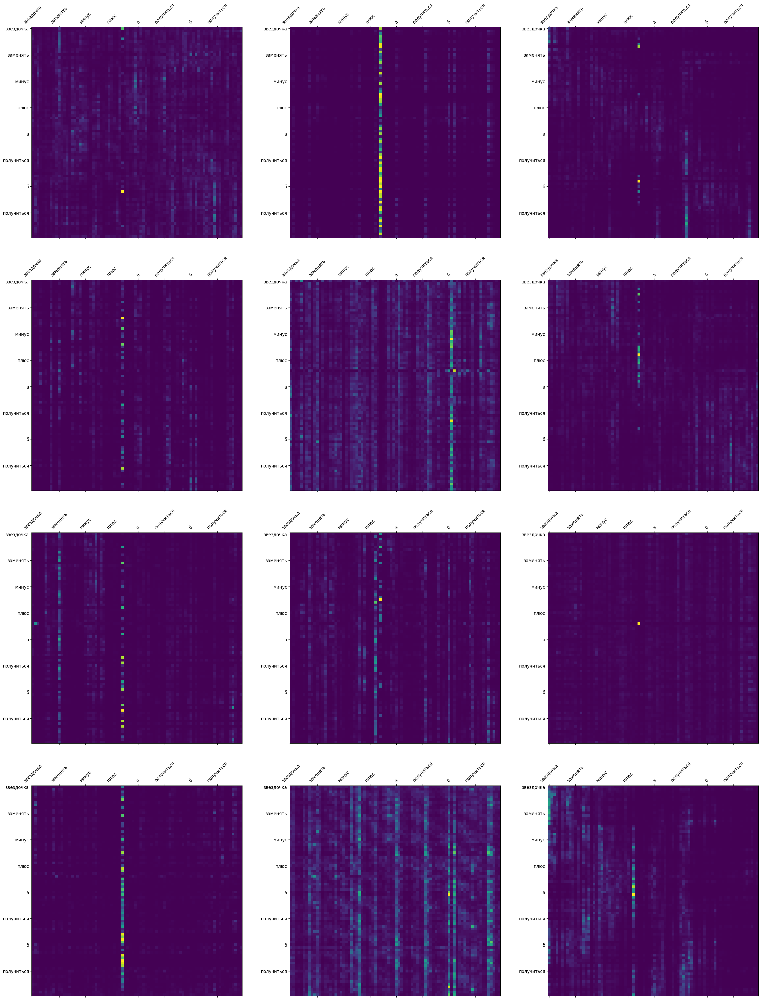

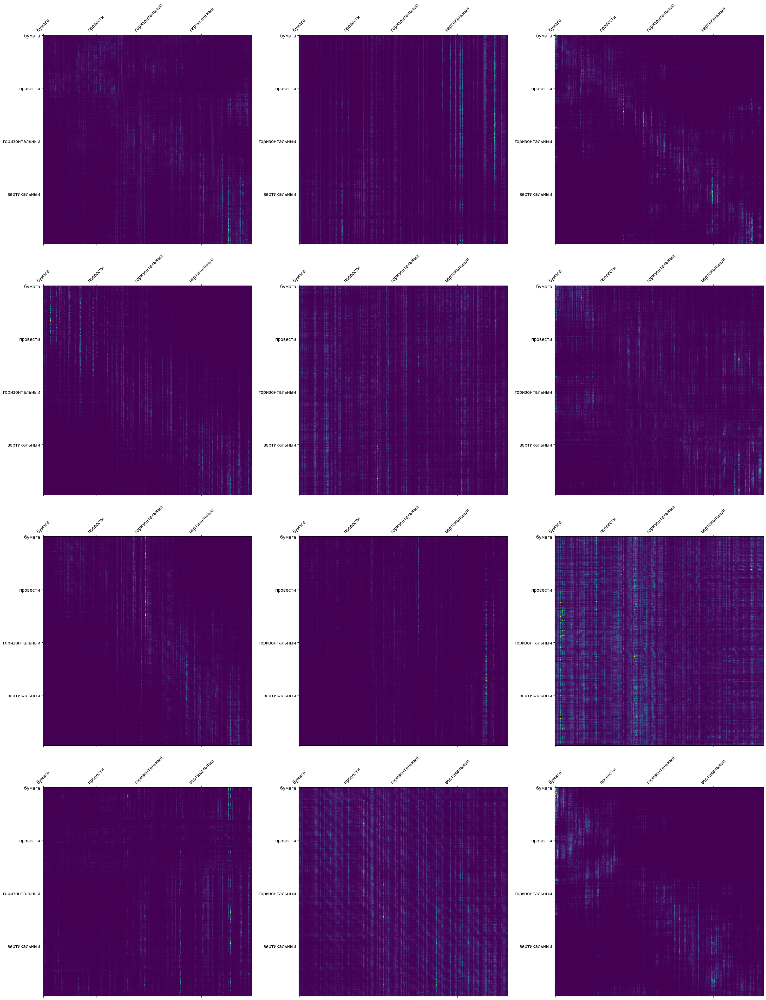

In [146]:
draw_first_layer_attention_maps(trained_tbs17, test_dataloader, tokenizer, device=device)

# rubert-tiny2

<ipython-input-130-bb7f92b6b28f>:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ticks,
<ipython-input-130-bb7f92b6b28f>:19: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ticks)
<ipython-input-130-bb7f92b6b28f>:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(ticker.FixedFormatter(ticks))
<ipython-input-130-bb7f92b6b28f>:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.yaxis.set_major_formatter(ticker.FixedFormatter(ticks))


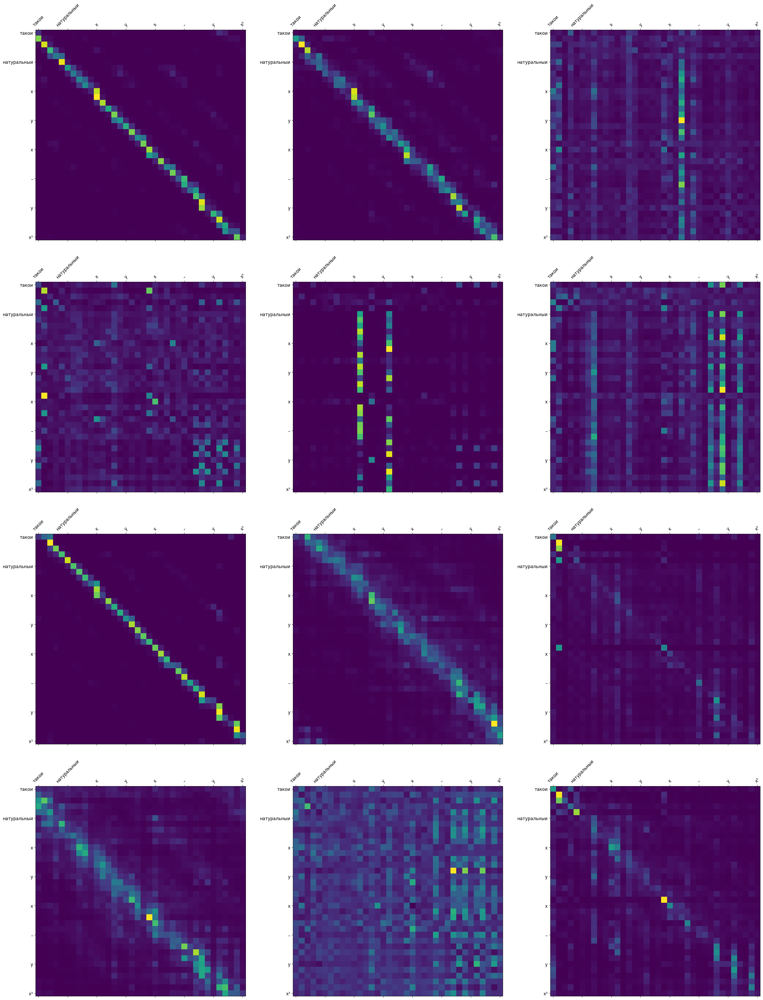

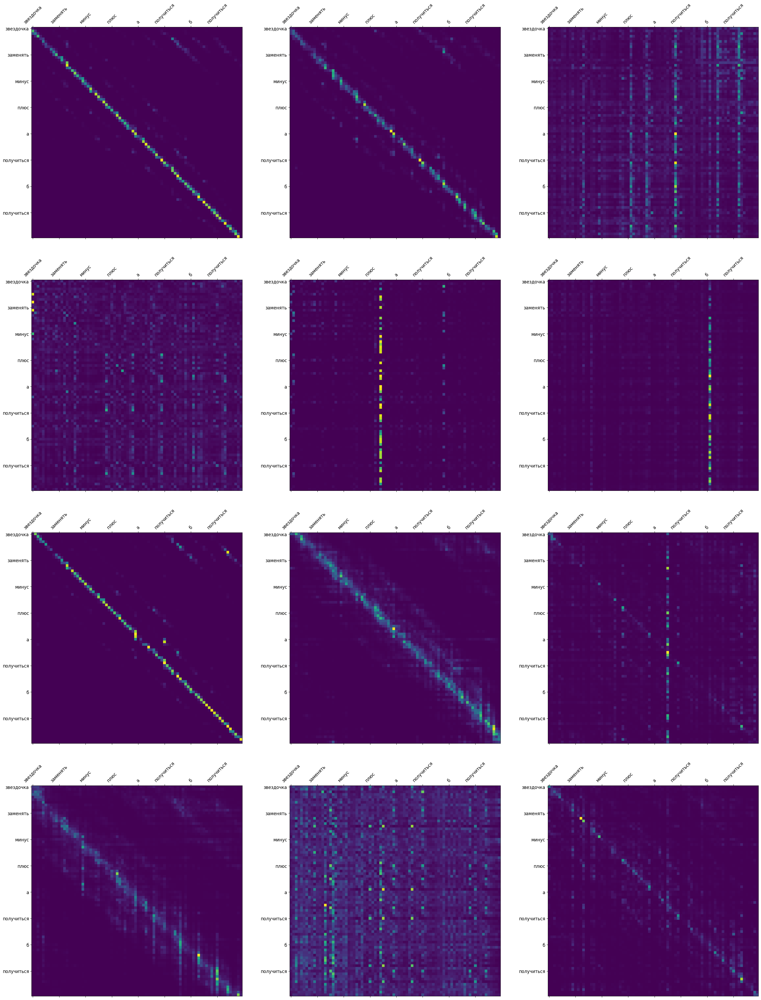

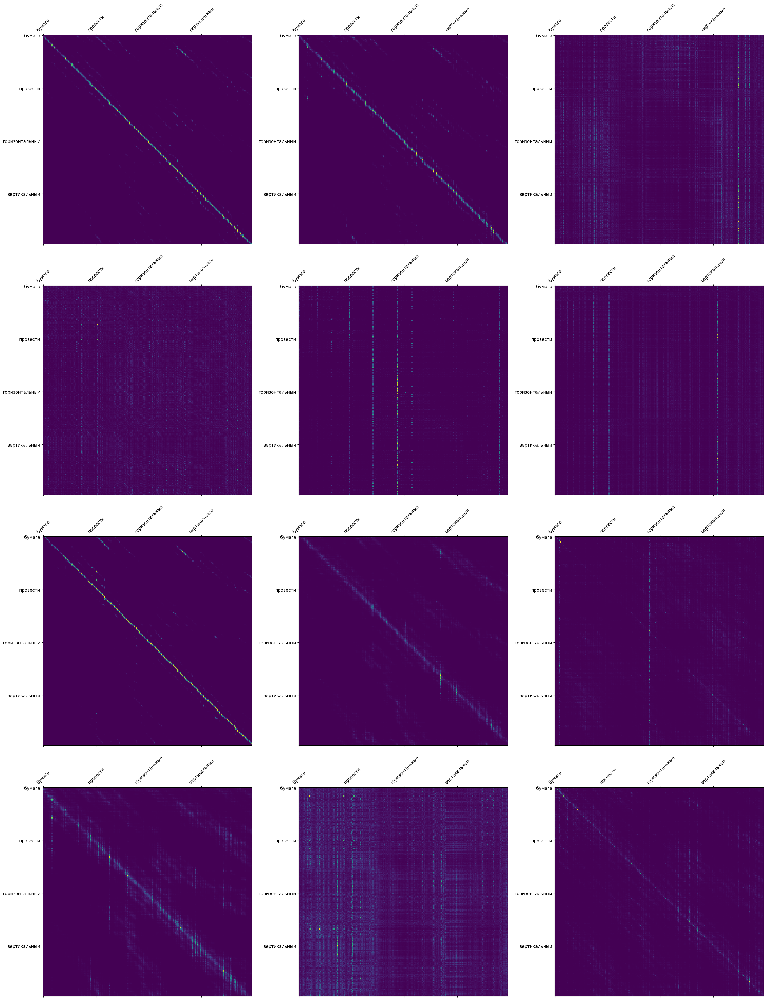

In [147]:
draw_first_layer_attention_maps(trained_tiny, test_dataloader, tokenizer, device=device)

Сами карты внимания остались похожи на себя.

P.S. Понимаю, что нужно было смотреть на внимание и его изменение между конкретными словами, но сил уже нет)